In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torchvision
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from __future__ import print_function
import argparse
import csv
import os.path
import torch.nn.parallel
import torch.utils.data as data
import torchvision.datasets as datasets
import torchvision.models as models
from PIL import Image
import PIL

gpu = 2
batch_size = 4

In [2]:
tempdir = '../data/parkIMG/train'

class TrainImageFolder(datasets.ImageFolder):

    def __getitem__(self, index):
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        
        image = super(TrainImageFolder, self).__getitem__(index)[0].numpy().transpose((1,2,0))
        image = std * image + mean
        input_gray = image
        input_gray = np.dot(input_gray[...,:3], [0.299, 0.587, 0.114])
        
        return torch.FloatTensor(input_gray.transpose((0,1))), torch.FloatTensor(image.transpose((2,0,1)))

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

train_loader = data.DataLoader(
        TrainImageFolder(tempdir,
                         transforms.Compose([
                             transforms.RandomResizedCrop(256),
                             transforms.RandomHorizontalFlip(),
                             transforms.ToTensor(),
                             normalize,
                         ])),
                        batch_size=batch_size,
                        shuffle=True,
                        num_workers=4,
                        pin_memory=True)

test_loader = data.DataLoader(
        TrainImageFolder(tempdir,
                        transforms.Compose([
                            transforms.RandomResizedCrop(256),
                            transforms.RandomHorizontalFlip(),
                            transforms.ToTensor(),
                            normalize,
                        ])),
                        batch_size=batch_size,
                        shuffle=False,
                        num_workers=4,
                        pin_memory=False)

In [3]:
def imshow(inp):
    inp = inp.numpy().transpose((1,2,0))
    print(inp.shape)
    inp = np.clip(inp, 0, 1) 
    plt.imshow(inp)

def gray_imshow(inp):
    inp = inp.numpy()#.transpose((1,2,0))
    print(inp.shape)
    plt.imshow(inp,cmap = plt.get_cmap('gray'))

In [4]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.encode = nn.Sequential(
            # 노이즈와 합쳐진 흑백 input
            # batch_size * (1+1) * 256 * 256
            nn.Conv2d(2, 16, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace = False),
            
            # batch_size * 16 * 256 * 256
            nn.Conv2d(16, 32, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace = False),
            nn.MaxPool2d(2),
            
            # batch_size * 32 * 128 * 128
            nn.Conv2d(32, 64, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = False),
            nn.MaxPool2d(2),
            
            # batch_size * 64 * 64 * 64
            nn.Conv2d(64, 128, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = False),
            
            # batch_size * 128 * 64 * 64
            nn.Conv2d(128, 256, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace = False),
            
            # batch_size * 256 * 64 * 64
            nn.UpsamplingNearest2d(scale_factor=2),
            
            # batch_size * 256 * 128 * 128
            nn.Conv2d(256, 128, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace = False),
            
            # batch_size * 128 * 128 * 128
            nn.UpsamplingNearest2d(scale_factor = 2),
            
            # batch_size * 128 * 256 * 256
            nn.Conv2d(128, 64, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace = False)
            # batch_size * 64 * 256 * 256
            )
        
        self.decode = nn.Sequential(
            #흑백이미지와 노이즈를 다시 합쳐줌
            # batch_size * (64 + 2) * 256 * 256
            nn.Conv2d(66, 32, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace = True),
            
            # batch_size * 32 * 256 * 256
            nn.Conv2d(32, 3, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.Sigmoid()
            # batch_size * 3 * 256 * 256
            )

    def forward(self, input):
        encoding = self.encode(input)
        decoding = self.decode(torch.cat([input,encoding], dim = 1))
        return decoding

In [5]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            #흑백이미지와 컬러이미지를 합쳐서 진행
            # 4 * 256 * 256
            nn.Conv2d(4,8,kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),
            
            # 8 * 128 * 128
            nn.Conv2d(8,16,kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2, inplace = True),
            
            # 16 * 64 * 64
            nn.Conv2d(16, 32, kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace = True),
            
            # 32 * 32 * 32
            nn.Conv2d(32, 64, kernel_size = 4, stride = 2, padding = 1, bias = False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace = True),
            
            # 64 * 16 * 16
            nn.Conv2d(64,32,kernel_size = 4, stride = 2, padding = 1 , bias = False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace = True),
            
            # 32 * 8 * 8
            nn.Conv2d(32,16,kernel_size = 4, stride = 2, padding = 1 , bias = False),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2, inplace = True),
            
            # 16 * 4 * 4
            nn.Conv2d(16, 1, kernel_size = 4, stride = 1, padding = 0 , bias = False),
            nn.Sigmoid()
            )
        
    def forward(self, input):
        output = self.main(input)
        """sigmoid로 가짜인지 진짜인지의 확률값으로 반환."""
        return output.view(-1,1).squeeze(1)
        

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:         # Conv weight init
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:  # BatchNorm weight init
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [7]:
D = Discriminator().cuda(gpu)
D.apply(weights_init)
G = Generator().cuda(gpu)
G.apply(weights_init)
noise = torch.FloatTensor(batch_size, 1, 256, 256)
label = torch.FloatTensor(batch_size)

real_label = 1
fake_label = 0

Loss= nn.BCELoss().cuda(gpu)
optimizerD = torch.optim.Adam(D.parameters(), lr = 0.0001,betas = (0.5, 0.999))
optimizerG = torch.optim.Adam(G.parameters(), lr = 0.0001, betas = (0.5, 0.999))

/opt/conda/envs/pytorch-py35/lib/python3.5/site-packages/torch/nn/modules/upsampling.py:135: UserWarning: nn.UpsamplingNearest2d is deprecated. Use nn.Upsample instead.
  warnings.warn("nn.UpsamplingNearest2d is deprecated. Use nn.Upsample instead.")


[1,    10]loss
0.5073148012161255
0.47484391927719116
(260, 1034, 3)


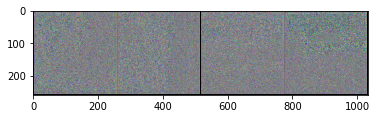

[1,    20]loss
0.5219031572341919
0.4916026294231415
(260, 1034, 3)


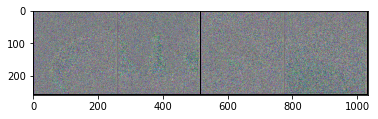

[1,    30]loss
0.5315013527870178
0.43231624364852905
(260, 1034, 3)


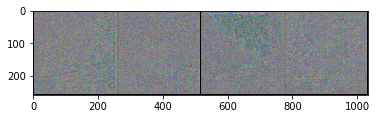

[1,    40]loss
0.5475863814353943
0.42418375611305237
(260, 1034, 3)


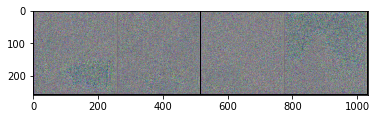

[1,    50]loss
0.5431599617004395
0.39391040802001953
(260, 1034, 3)


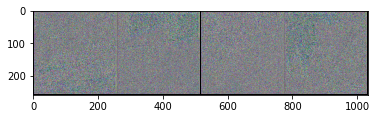

[1,    60]loss
0.5766257643699646
0.34118449687957764
(260, 1034, 3)


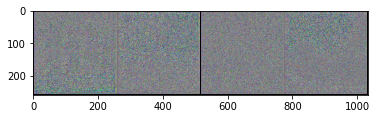

[1,    70]loss
0.512514054775238
0.3025399446487427
(260, 1034, 3)


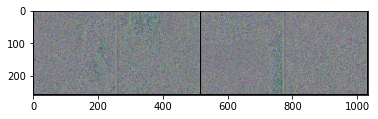

[1,    80]loss
0.6779724955558777
0.26951882243156433
(260, 1034, 3)


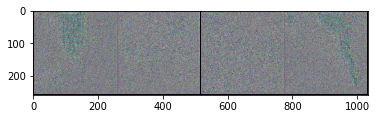

[1,    90]loss
0.6058775186538696
0.21936862170696259
(260, 1034, 3)


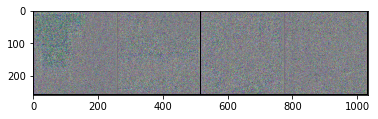

[1,   100]loss
0.6849604845046997
0.1733655333518982
(260, 1034, 3)


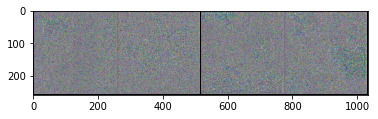

[1,   110]loss
0.7984312176704407
0.14024139940738678
(260, 1034, 3)


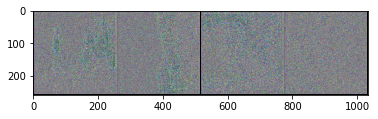

[1,   120]loss
0.834272027015686
0.12306345999240875
(260, 1034, 3)


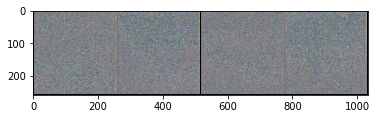

[1,   130]loss
0.8501198291778564
0.10222239792346954
(260, 1034, 3)


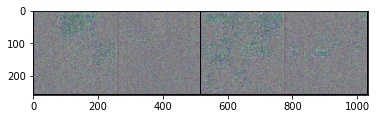

[1,   140]loss
0.8558945059776306
0.08867869526147842
(260, 1034, 3)


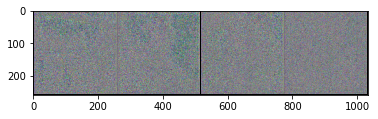

[1,   150]loss
0.9022656679153442
0.08467850089073181
(260, 1034, 3)


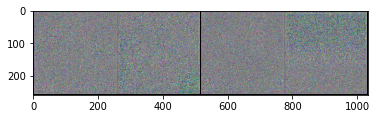

[1,   160]loss
0.9125450253486633
0.06603825092315674
(260, 1034, 3)


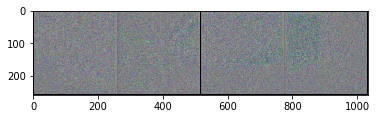

[1,   170]loss
0.9207053184509277
0.06460483372211456
(260, 1034, 3)


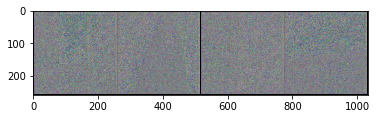

[1,   180]loss
0.9153645634651184
0.061357975006103516
(260, 1034, 3)


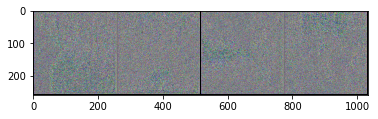

[1,   190]loss
0.9298361539840698
0.055996496230363846
(260, 1034, 3)


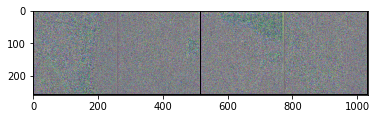

[1,   200]loss
0.934318482875824
0.05256550759077072
(260, 1034, 3)


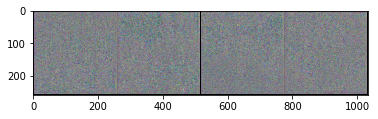

[1,   210]loss
0.9367049932479858
0.04689963907003403
(260, 1034, 3)


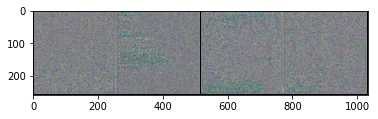

[1,   220]loss
0.9486011266708374
0.04356524348258972
(260, 1034, 3)


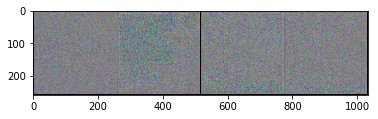

[1,   230]loss
0.937358021736145
0.04341943934559822
(260, 1034, 3)


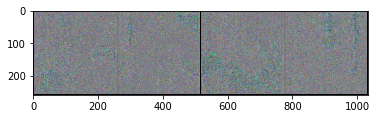

[1,   240]loss
0.9555485248565674
0.03900374472141266
(260, 1034, 3)


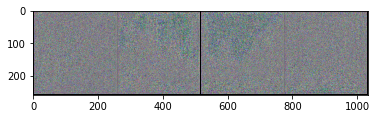

[1,   250]loss
0.958825409412384
0.03547924757003784
(260, 1034, 3)


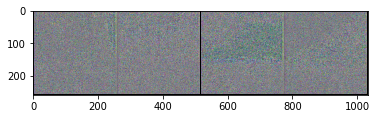

[1,   260]loss
0.9600339531898499
0.03240329772233963
(260, 1034, 3)


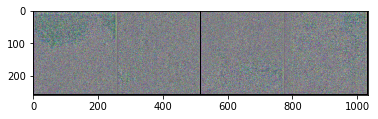

[1,   270]loss
0.9580249786376953
0.03284836933016777
(260, 1034, 3)


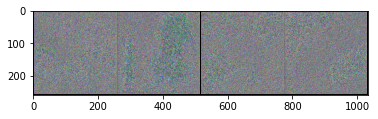

[1,   280]loss
0.9575642943382263
0.030942251905798912
(260, 1034, 3)


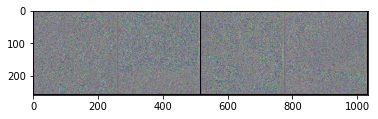

[1,   290]loss
0.9656515121459961
0.029040057212114334
(260, 1034, 3)


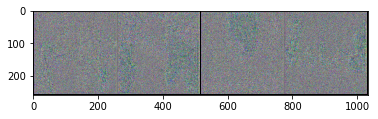

[1,   300]loss
0.9666928052902222
0.02837231010198593
(260, 1034, 3)


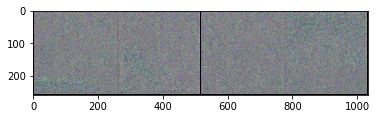

[1,   310]loss
0.9688875675201416
0.026016535237431526
(260, 1034, 3)


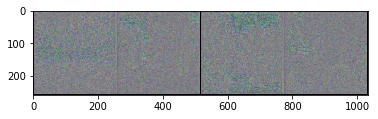

[2,    10]loss
0.9753685593605042
0.025024890899658203
(260, 1034, 3)


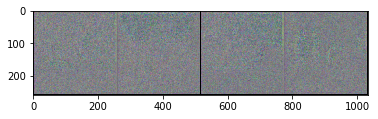

[2,    20]loss
0.9690643548965454
0.02364264242351055
(260, 1034, 3)


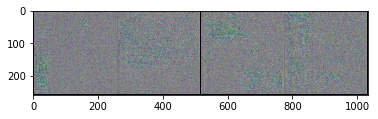

[2,    30]loss
0.9745646715164185
0.023041220381855965
(260, 1034, 3)


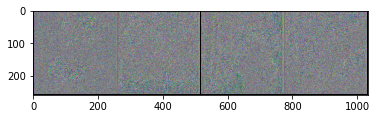

[2,    40]loss
0.9746369123458862
0.02092631720006466
(260, 1034, 3)


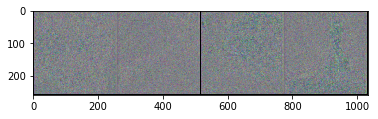

[2,    50]loss
0.9737475514411926
0.02099752426147461
(260, 1034, 3)


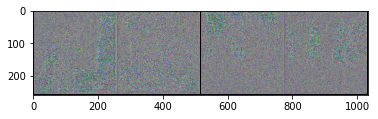

[2,    60]loss
0.9762573838233948
0.02017044648528099
(260, 1034, 3)


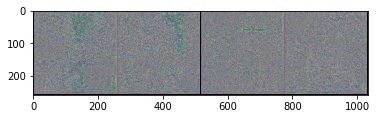

[2,    70]loss
0.9775614142417908
0.019662925973534584
(260, 1034, 3)


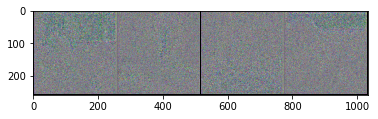

[2,    80]loss
0.9779849052429199
0.018591642379760742
(260, 1034, 3)


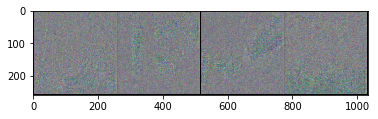

[2,    90]loss
0.979299008846283
0.017508111894130707
(260, 1034, 3)


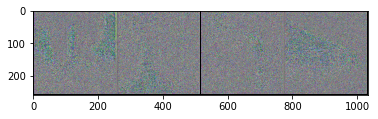

[2,   100]loss
0.9815924167633057
0.016226189211010933
(260, 1034, 3)


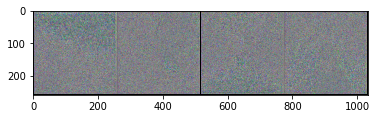

[2,   110]loss
0.982641339302063
0.016375772655010223
(260, 1034, 3)


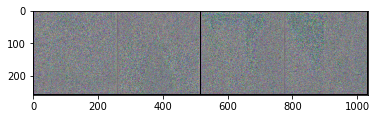

[2,   120]loss
0.9824039340019226
0.015891458839178085
(260, 1034, 3)


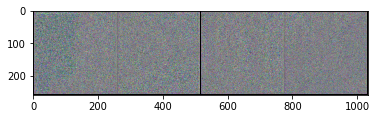

[2,   130]loss
0.9843552112579346
0.014903728850185871
(260, 1034, 3)


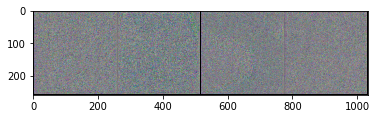

[2,   140]loss
0.9826666712760925
0.014810939319431782
(260, 1034, 3)


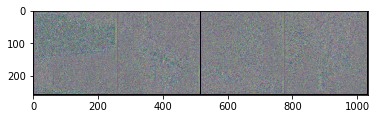

[2,   150]loss
0.9840837717056274
0.014396538957953453
(260, 1034, 3)


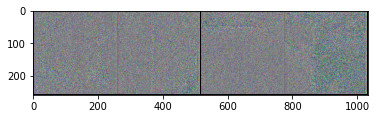

[2,   160]loss
0.9811739921569824
0.013894989155232906
(260, 1034, 3)


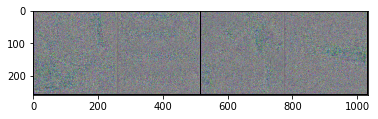

[2,   170]loss
0.9855053424835205
0.013043003156781197
(260, 1034, 3)


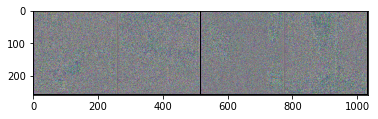

[2,   180]loss
0.9854930639266968
0.013014157302677631
(260, 1034, 3)


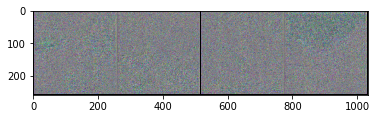

[2,   190]loss
0.9868324398994446
0.01222799438983202
(260, 1034, 3)


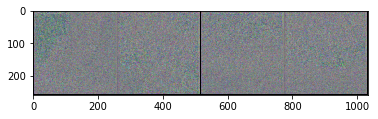

[2,   200]loss
0.9867314100265503
0.011912288144230843
(260, 1034, 3)


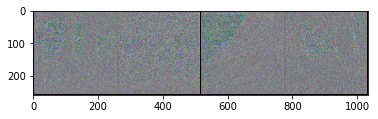

[2,   210]loss
0.9857466220855713
0.011696889065206051
(260, 1034, 3)


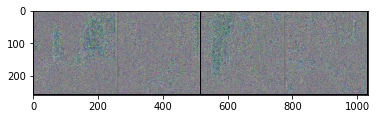

[2,   220]loss
0.9887658357620239
0.010884221643209457
(260, 1034, 3)


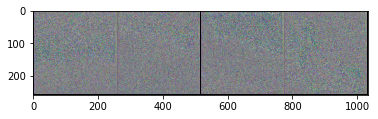

[2,   230]loss
0.9874250888824463
0.010824598371982574
(260, 1034, 3)


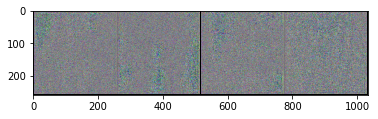

[2,   240]loss
0.987564206123352
0.010732239112257957
(260, 1034, 3)


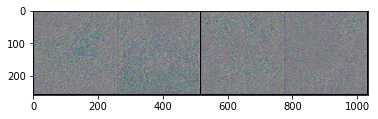

[2,   250]loss
0.9872490167617798
0.010464411228895187
(260, 1034, 3)


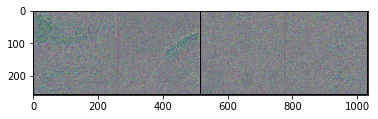

[2,   260]loss
0.9884788393974304
0.010673494078218937
(260, 1034, 3)


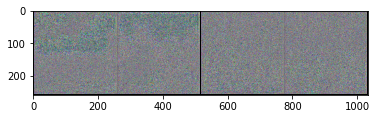

[2,   270]loss
0.9901264905929565
0.009571030735969543
(260, 1034, 3)


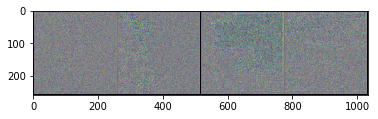

[2,   280]loss
0.990416407585144
0.009235601872205734
(260, 1034, 3)


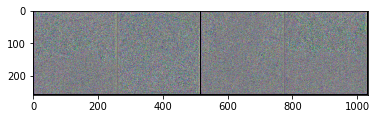

[2,   290]loss
0.9900721907615662
0.0093536376953125
(260, 1034, 3)


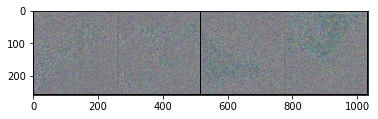

[2,   300]loss
0.9911473393440247
0.008825084194540977
(260, 1034, 3)


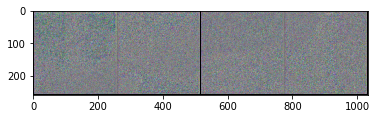

[2,   310]loss
0.9909419417381287
0.008757439441978931
(260, 1034, 3)


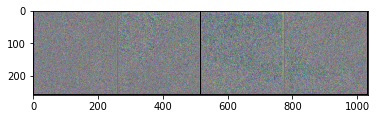

[3,    10]loss
0.9907891154289246
0.00838391575962305
(260, 1034, 3)


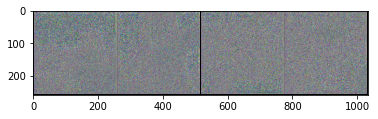

[3,    20]loss
0.9911371469497681
0.008273565210402012
(260, 1034, 3)


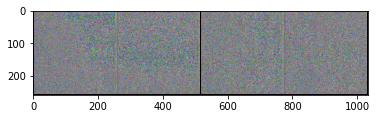

[3,    30]loss
0.9908183813095093
0.008114557713270187
(260, 1034, 3)


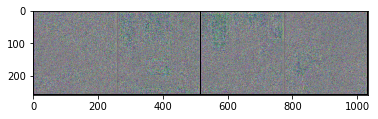

[3,    40]loss
0.9913288354873657
0.007774029858410358
(260, 1034, 3)


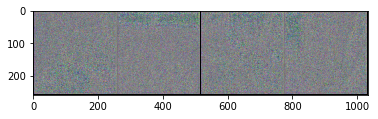

[3,    50]loss
0.9913380146026611
0.007601325400173664
(260, 1034, 3)


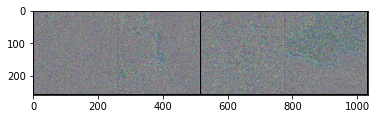

[3,    60]loss
0.9902732968330383
0.007598766125738621
(260, 1034, 3)


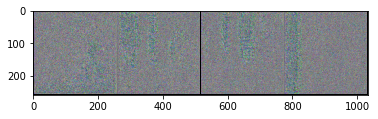

[3,    70]loss
0.9921309947967529
0.0071720462292432785
(260, 1034, 3)


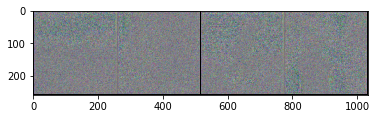

[3,    80]loss
0.9929618835449219
0.007097907364368439
(260, 1034, 3)


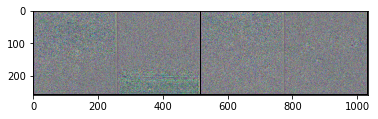

[3,    90]loss
0.9924658536911011
0.00685077253729105
(260, 1034, 3)


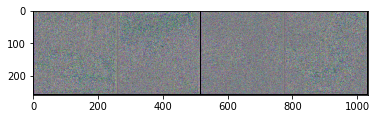

[3,   100]loss
0.9926576614379883
0.00681731104850769
(260, 1034, 3)


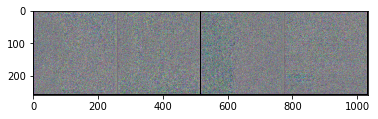

[3,   110]loss
0.9922484755516052
0.006682079751044512
(260, 1034, 3)


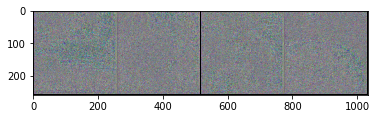

[3,   120]loss
0.9936158657073975
0.006386726628988981
(260, 1034, 3)


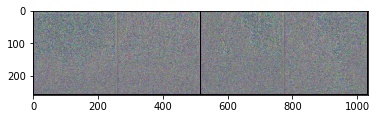

[3,   130]loss
0.992709755897522
0.006293723825365305
(260, 1034, 3)


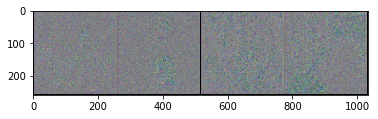

[3,   140]loss
0.9932886362075806
0.00613846629858017
(260, 1034, 3)


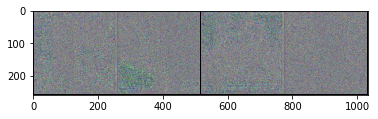

[3,   150]loss
0.9937580823898315
0.0059060691855847836
(260, 1034, 3)


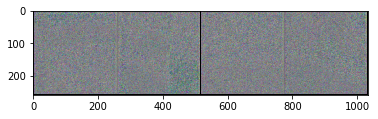

[3,   160]loss
0.9934086203575134
0.005913125351071358
(260, 1034, 3)


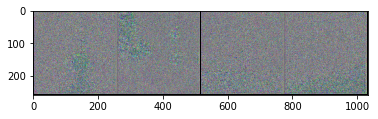

[3,   170]loss
0.9925938844680786
0.00583578459918499
(260, 1034, 3)


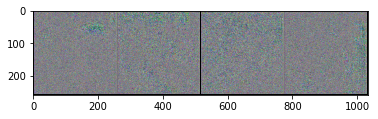

[3,   180]loss
0.9932636618614197
0.0056937457993626595
(260, 1034, 3)


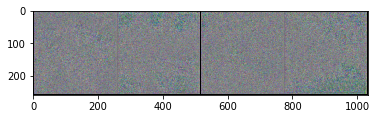

[3,   190]loss
0.9943435192108154
0.005488348659127951
(260, 1034, 3)


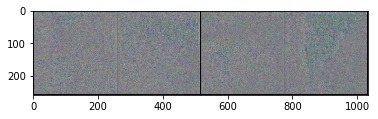

[3,   200]loss
0.9937881231307983
0.0055297729559242725
(260, 1034, 3)


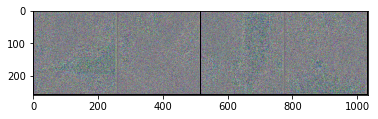

[3,   210]loss
0.9936061501502991
0.005256190896034241
(260, 1034, 3)


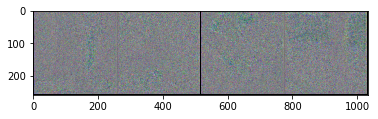

[3,   220]loss
0.9945188760757446
0.005110995844006538
(260, 1034, 3)


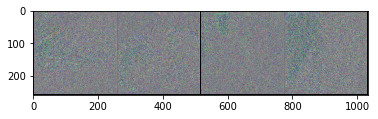

[3,   230]loss
0.9947033524513245
0.005110957194119692
(260, 1034, 3)


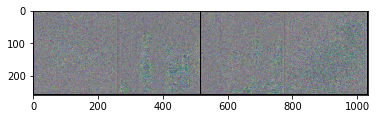

[3,   240]loss
0.9941672086715698
0.0050406064838171005
(260, 1034, 3)


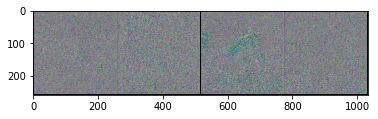

[3,   250]loss
0.9948465824127197
0.004771741107106209
(260, 1034, 3)


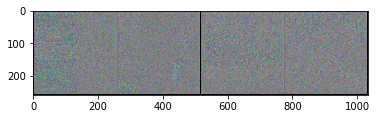

[3,   260]loss
0.9945542812347412
0.004998946562409401
(260, 1034, 3)


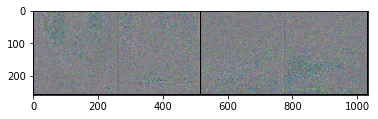

[3,   270]loss
0.99529629945755
0.004647817462682724
(260, 1034, 3)


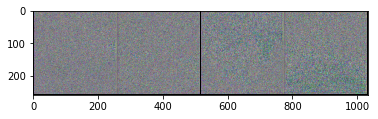

[3,   280]loss
0.9948081970214844
0.004693655297160149
(260, 1034, 3)


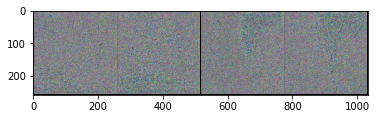

[3,   290]loss
0.9950057864189148
0.004604077897965908
(260, 1034, 3)


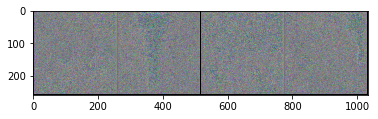

[3,   300]loss
0.9945921897888184
0.004480941686779261
(260, 1034, 3)


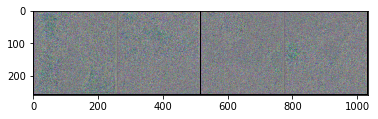

[3,   310]loss
0.9952927231788635
0.0044116731733083725
(260, 1034, 3)


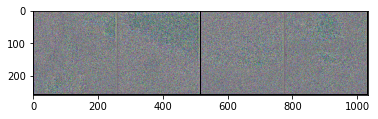

[4,    10]loss
0.9953261613845825
0.004236970562487841
(260, 1034, 3)


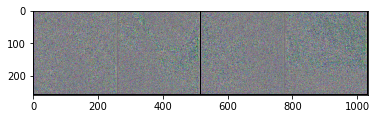

[4,    20]loss
0.9956953525543213
0.0041643790900707245
(260, 1034, 3)


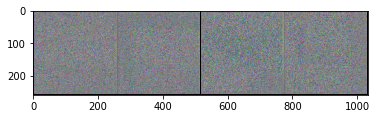

[4,    30]loss
0.9946017861366272
0.004285402130335569
(260, 1034, 3)


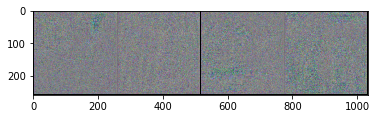

[4,    40]loss
0.995335042476654
0.004205289762467146
(260, 1034, 3)


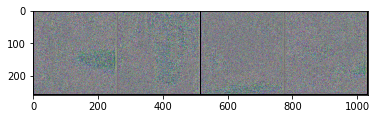

[4,    50]loss
0.9957627654075623
0.004014064557850361
(260, 1034, 3)


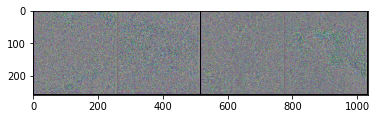

[4,    60]loss
0.9953203797340393
0.003958896268159151
(260, 1034, 3)


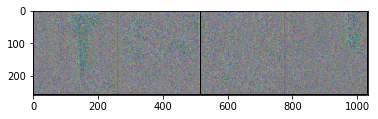

[4,    70]loss
0.9952012300491333
0.003997763618826866
(260, 1034, 3)


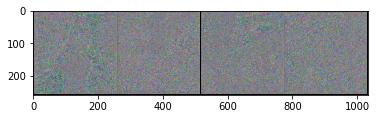

[4,    80]loss
0.9960847496986389
0.0037465549539774656
(260, 1034, 3)


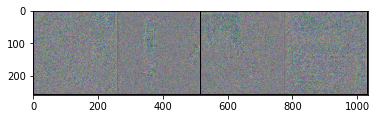

[4,    90]loss
0.9960813522338867
0.0036054395604878664
(260, 1034, 3)


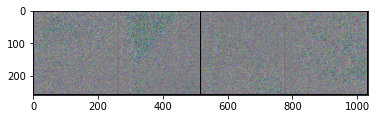

[4,   100]loss
0.9961948990821838
0.003615809604525566
(260, 1034, 3)


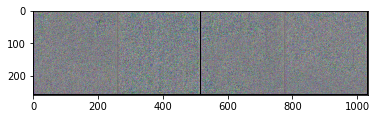

[4,   110]loss
0.9960631132125854
0.0035913295578211546
(260, 1034, 3)


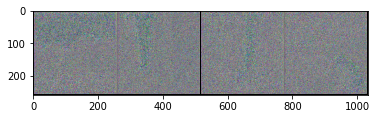

[4,   120]loss
0.9962224960327148
0.0035597779788076878
(260, 1034, 3)


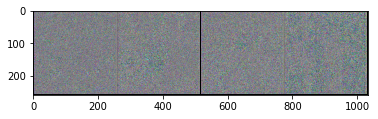

[4,   130]loss
0.996063768863678
0.0035407710820436478
(260, 1034, 3)


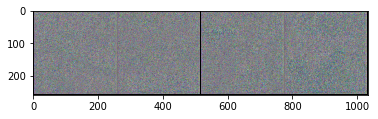

[4,   140]loss
0.9964483976364136
0.0033841656986624002
(260, 1034, 3)


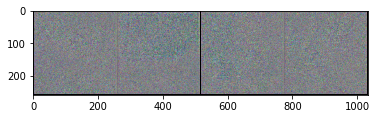

[4,   150]loss
0.996086835861206
0.003402737434953451
(260, 1034, 3)


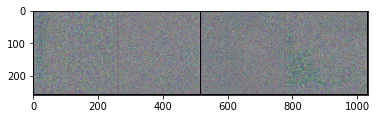

[4,   160]loss
0.996410071849823
0.0033389865420758724
(260, 1034, 3)


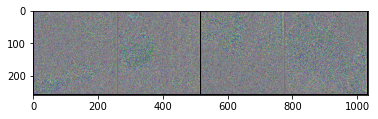

[4,   170]loss
0.9966480731964111
0.003249548841267824
(260, 1034, 3)


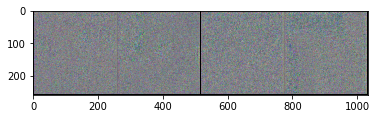

[4,   180]loss
0.9966620206832886
0.0032044374383985996
(260, 1034, 3)


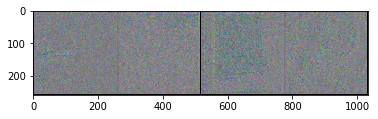

[4,   190]loss
0.9964228868484497
0.003217460820451379
(260, 1034, 3)


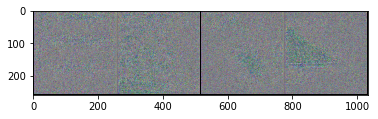

[4,   200]loss
0.996774435043335
0.0030609378591179848
(260, 1034, 3)


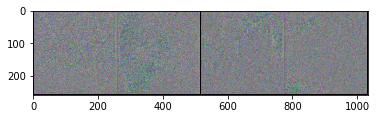

[4,   210]loss
0.9967301487922668
0.0031108534894883633
(260, 1034, 3)


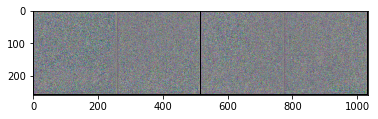

[4,   220]loss
0.996478796005249
0.002990234410390258
(260, 1034, 3)


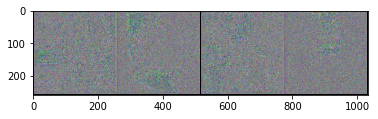

[4,   230]loss
0.996894359588623
0.0029087639413774014
(260, 1034, 3)


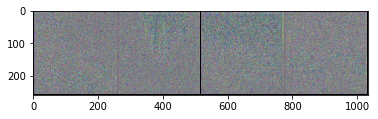

[4,   240]loss
0.9966322183609009
0.0029628551565110683
(260, 1034, 3)


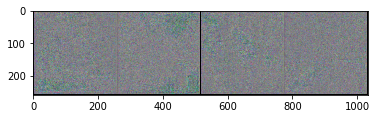

[4,   250]loss
0.996860146522522
0.002892201067879796
(260, 1034, 3)


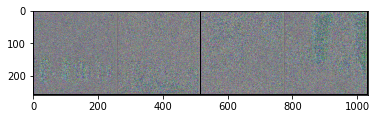

[4,   260]loss
0.9969536066055298
0.002829328877851367
(260, 1034, 3)


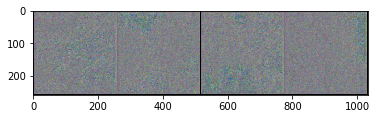

[4,   270]loss
0.9965804219245911
0.0029141001868993044
(260, 1034, 3)


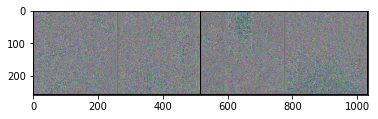

[4,   280]loss
0.9968573451042175
0.002767127938568592
(260, 1034, 3)


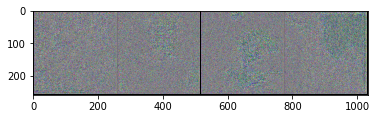

[4,   290]loss
0.997144341468811
0.002631537616252899
(260, 1034, 3)


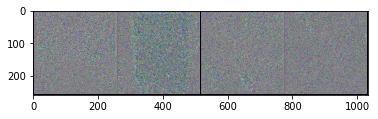

[4,   300]loss
0.9971364736557007
0.0026845287065953016
(260, 1034, 3)


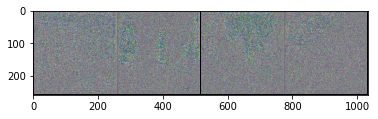

[4,   310]loss
0.9971480965614319
0.002636144170537591
(260, 1034, 3)


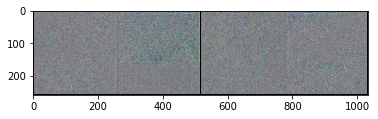

[5,    10]loss
0.997130274772644
0.0025664728600531816
(260, 1034, 3)


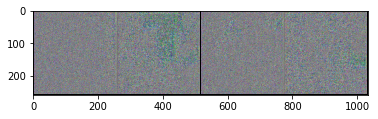

[5,    20]loss
0.9972995519638062
0.002494199201464653
(260, 1034, 3)


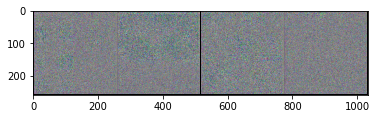

[5,    30]loss
0.9970837235450745
0.0025109967682510614
(260, 1034, 3)


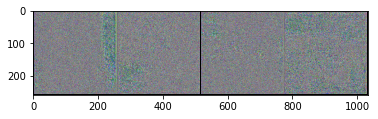

[5,    40]loss
0.9973762631416321
0.0024317523930221796
(260, 1034, 3)


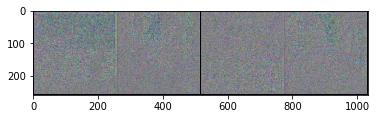

[5,    50]loss
0.9974034428596497
0.002416369505226612
(260, 1034, 3)


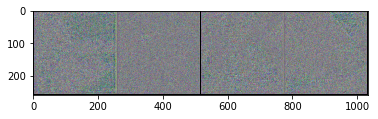

[5,    60]loss
0.9972350001335144
0.0023450637236237526
(260, 1034, 3)


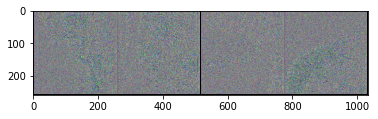

[5,    70]loss
0.9973152279853821
0.00243665324524045
(260, 1034, 3)


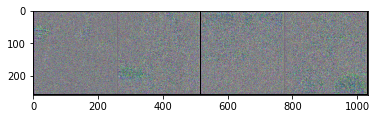

[5,    80]loss
0.9974885582923889
0.0023806849494576454
(260, 1034, 3)


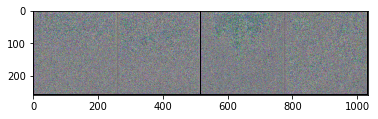

[5,    90]loss
0.997276782989502
0.0023597548715770245
(260, 1034, 3)


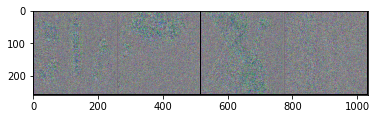

[5,   100]loss
0.9975165128707886
0.0023296335712075233
(260, 1034, 3)


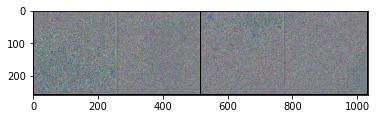

[5,   110]loss
0.99751877784729
0.0023416047915816307
(260, 1034, 3)


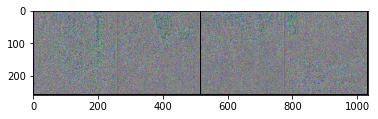

[5,   120]loss
0.9977627992630005
0.002188961487263441
(260, 1034, 3)


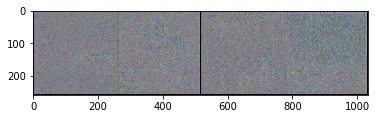

[5,   130]loss
0.9976232647895813
0.002248182659968734
(260, 1034, 3)


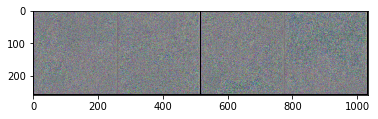

[5,   140]loss
0.997757613658905
0.0021732342429459095
(260, 1034, 3)


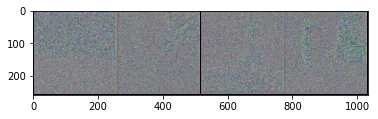

[5,   150]loss
0.9976613521575928
0.00208407174795866
(260, 1034, 3)


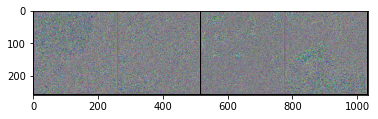

[5,   160]loss
0.9975646734237671
0.0020780509803444147
(260, 1034, 3)


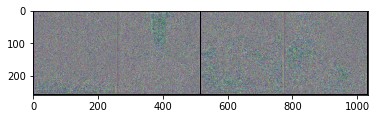

[5,   170]loss
0.9974562525749207
0.002111865906044841
(260, 1034, 3)


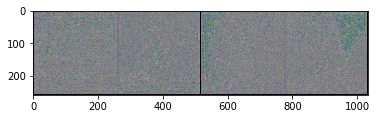

[5,   180]loss
0.997856080532074
0.0020456486381590366
(260, 1034, 3)


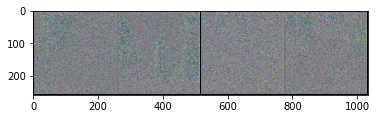

[5,   190]loss
0.9978074431419373
0.001988941803574562
(260, 1034, 3)


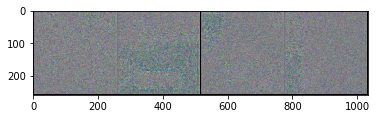

[5,   200]loss
0.997685432434082
0.002011238131672144
(260, 1034, 3)


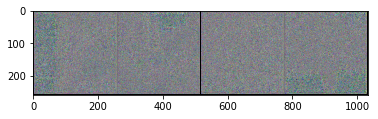

[5,   210]loss
0.9974890351295471
0.001962349284440279
(260, 1034, 3)


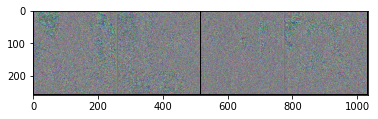

[5,   220]loss
0.9976546168327332
0.0019738757982850075
(260, 1034, 3)


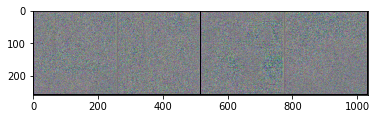

[5,   230]loss
0.9979649782180786
0.0019101392244920135
(260, 1034, 3)


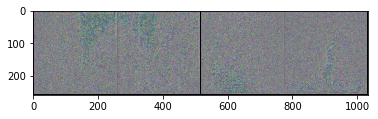

[5,   240]loss
0.9979744553565979
0.0018645166419446468
(260, 1034, 3)


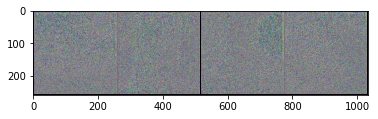

[5,   250]loss
0.997887372970581
0.0018578666495159268
(260, 1034, 3)


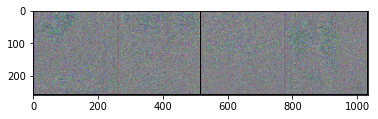

[5,   260]loss
0.9979162216186523
0.0018435787642374635
(260, 1034, 3)


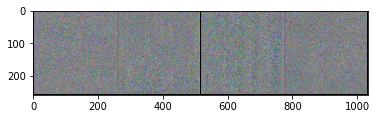

[5,   270]loss
0.9980283975601196
0.001813697861507535
(260, 1034, 3)


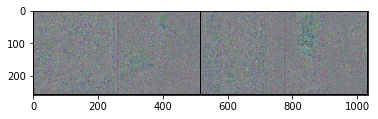

[5,   280]loss
0.9980558156967163
0.001823134021833539
(260, 1034, 3)


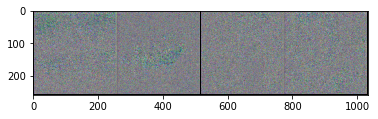

[5,   290]loss
0.9982011318206787
0.0017766579985618591
(260, 1034, 3)


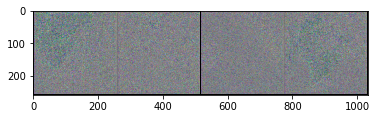

[5,   300]loss
0.9981905221939087
0.0017558424733579159
(260, 1034, 3)


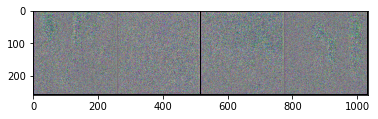

In [ ]:
for epoch in range(50):
    loss_D = 0.0
    for i, data in enumerate(train_loader):
        gray, color = data
        gray = np.resize(gray.numpy(),(batch_size,1,256,256))
        #gray : batch_size * 1 * 256 * 256, color : batch_size * 3 * 256 * 256
        
        #discriminator
        
        #real
        D.zero_grad()
        
        #진짜 이미지를 학습해야 하므로 real_label(=1) 로 학습하도록한다.
        label.fill_(real_label)
        
        #inputs을 color 이미지와 gray 이미지를 합쳐서 생성.
        inputs = Variable(torch.from_numpy(np.concatenate((color.numpy(), gray),axis = 1))).cuda(gpu)
        #inputs = Variable(inputs).cuda(gpu)
        labelv = Variable(label).cuda(gpu)
        
        output = D(inputs)
        loss_D_real = Loss(output, labelv)
        loss_D_real.backward()
        D_x = output.data.mean()
        
        #real end
        
        #fake
        
        # batch_size * 1 * 256 * 256
        noise.uniform_(0,1)
        gray_noise = np.concatenate((gray, noise.numpy()), axis = 1)
        gray_noise = Variable(torch.from_numpy(gray_noise)).cuda(gpu)
        
        fake = G(gray_noise)
        fake_img = fake
        fake = torch.from_numpy(np.concatenate((fake.data.cpu().numpy(), gray),axis = 1))
        fake = Variable(fake).cuda(gpu)
        
        labelv = Variable(label.fill_(fake_label)).cuda(gpu)
        output = D(fake)
        loss_D_fake = Loss(output, labelv)
        loss_D_fake.backward()
        
        D_G_1 = output.data.mean()
        
        loss_D += loss_D_real + loss_D_fake
        
        optimizerD.step()
        
        # generator
        
        G.zero_grad()
        
        labelv = Variable(label.fill_(real_label)).cuda(gpu)
        output = D(fake)
        
        loss_G = Loss(output, labelv)
        loss_G.backward()
        
        D_G_2 = output.data.mean()
        optimizerG.step()
        
        
        #print(fake.shape)
        fake_img = torchvision.utils.make_grid(fake_img.data)
#         out = torchvision.utils.make_grid(outputs.data)
#         inp = torchvision.utils.make_grid(input.data)
#         label = torchvision.utils.make_grid(label.data)
        if i%10 == 9:
            print('[%d, %5d]loss' % (epoch + 1, i+1))
            print(D_x)
            print(D_G_1)
            running_loss = 0.0
        if i%10 == 9:
            #print(outputs.data[0].cpu().numpy().shape)
            imshow(fake_img.cpu())
            plt.show()
#             imshow(inp.cpu())
#             plt.show()
#             imshow(out.cpu())
#             plt.show()
#             imshow(label.cpu())
#             plt.show()

In [ ]:
model.eval()

for i, data in enumerate(test_loader,0) :
    images, label = data
    images = torch.FloatTensor(np.resize(images.numpy(),(4,1,256,256)))

    images, label = Variable(images.cuda(gpu)), Variable(label.cuda(gpu))
                
    output = model(images)
        
    out = torchvision.utils.make_grid(output.data)
    images = torchvision.utils.make_grid(images.data)
    imshow(images.cpu())
    plt.show()
    imshow(out.cpu())
    plt.show()